In [3]:
import pandas as pd
import numpy as np
import pymongo
import sys
import os
from __future__ import print_function
from datetime import datetime

TOP = '/'.join(os.getcwd().split('/')[:-2])+'/'
LIB = TOP+'lib'
if not LIB in sys.path: 
    sys.path.insert(0,LIB)

DAT_DIR = TOP + 'data/'
FIG_DIR = TOP + 'figs/'

if not os.path.exists(DAT_DIR): os.mkdir(DAT_DIR)
if not os.path.exists(FIG_DIR): os.mkdir(FIG_DIR)
    
from db.mongo import *

#from rax.genrapred import *
#import db.etl as etl
#from db.fpsim import *

In [2]:
import os
'/'.join(os.getcwd().split('/')[:-2])+'/'

'/share/home3/gpatlewi/python/GenRA_George/genra-analysis/'

In [4]:
#Reading in the file separately
df = pd.read_csv(DAT_DIR+'small_acute_processed.csv')

In [5]:
df.head()

,dsstox_sid,very_toxic,nontoxic,LD50_mgkg,EPA_category,GHS_category,casrn,mol_weight,LD50_LM
0,DTXSID5020281,False,False,460.0,2.0,4.0,100-00-5,157.550003,-0.465339
1,DTXSID8020961,False,False,750.0,3.0,4.0,100-01-6,138.126007,-0.734786
2,DTXSID0021834,False,False,170.0,2.0,3.0,100-02-7,139.110001,-0.087091
3,DTXSID2044347,False,False,1720.0,3.0,4.0,100-06-1,150.177002,-1.058925
4,DTXSID4025745,False,False,1809.0,3.0,4.0,100-14-1,171.580002,-1.022972


In [6]:
df.set_index('dsstox_sid', inplace = True)

In [7]:
df[df['LD50_LM'].isnull()]

,very_toxic,nontoxic,LD50_mgkg,EPA_category,GHS_category,casrn,mol_weight,LD50_LM
dsstox_sid,,,,,,,,


<h1>EDA</h1>

In [8]:
sid_counts=df.index.value_counts()
sid_counts.head()

DTXSID20201739    1
DTXSID70181734    1
DTXSID8048781     1
DTXSID4044452     1
DTXSID8023973     1
Name: dsstox_sid, dtype: int64

In [9]:
df.describe()

,LD50_mgkg,EPA_category,GHS_category,mol_weight,LD50_LM
count,7011.000000,7011.000000,7011.000000,7011.000000,7011.000000
mean,2389.517177,2.666952,3.953502,255.096485,-0.499707
std,4265.765237,0.824321,1.005608,129.789605,0.881428
min,0.012000,1.000000,1.000000,30.026000,-2.708793
25%,268.000000,2.000000,3.000000,163.070999,-1.116684
50%,1000.000000,3.000000,4.000000,235.287003,-0.642235
75%,2700.000000,3.000000,5.000000,320.014999,-0.063118
max,70000.000000,4.000000,5.000000,1701.206055,4.663991


In [14]:
import matplotlib.pyplot as plt
from math import log, exp
from scipy import stats

In [13]:
df['LD50_mgkg'].max()

70000.0

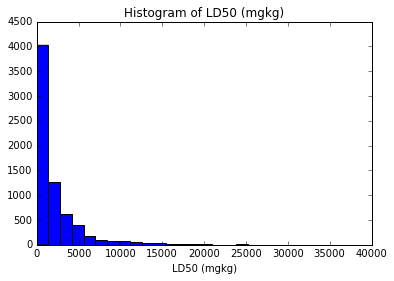

In [14]:
# trucated to 40,000 for viewing purposes
hist=plt.hist(df['LD50_mgkg'].dropna(),bins=50)
plt.title("Histogram of LD50 (mgkg)")
plt.xlabel('LD50 (mgkg)')
plt.xlim([0,40000])
plt.show()

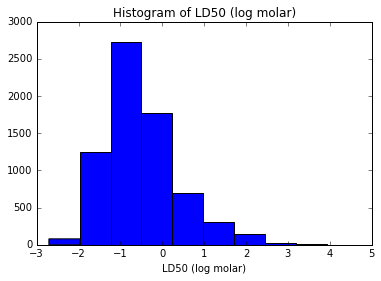

In [13]:
hist=plt.hist(df['LD50_LM'].dropna())
plt.title("Histogram of LD50 (log molar)")
plt.xlabel('LD50 (log molar)')
plt.show()

<h1>Analysis</h1>

In [6]:
sids=list(df.index.unique())

In [7]:
sids

['DTXSID5020281',
 'DTXSID8020961',
 'DTXSID0021834',
 'DTXSID2044347',
 'DTXSID4025745',
 'DTXSID9059208',
 'DTXSID7026653',
 'DTXSID6026080',
 'DTXSID80870440',
 'DTXSID7026655',
 'DTXSID8043868',
 'DTXSID7057606',
 'DTXSID5021837',
 'DTXSID3021437',
 'DTXSID3020596',
 'DTXSID2021284',
 'DTXSID0051499',
 'DTXSID0020153',
 'DTXSID7021491',
 'DTXSID5020152',
 'DTXSID8039241',
 'DTXSID6026664',
 'DTXSID1026665',
 'DTXSID3059216',
 'DTXSID9021841',
 'DTXSID8021147',
 'DTXSID3025889',
 'DTXSID4041608',
 'DTXSID8059217',
 'DTXSID1026667',
 'DTXSID30274151',
 'DTXSID5025312',
 'DTXSID8021060',
 'DTXSID2057607',
 'DTXSID9021845',
 'DTXSID1047601',
 'DTXSID5041809',
 'DTXSID30861707',
 'DTXSID20878647',
 'DTXSID6020692',
 'DTXSID0061379',
 'DTXSID3032622',
 'DTXSID00142939',
 'DTXSID80889259',
 'DTXSID60872280',
 'DTXSID20143004',
 'DTXSID8073134',
 'DTXSID6045953',
 'DTXSID00143108',
 'DTXSID7046623',
 'DTXSID40883637',
 'DTXSID70143115',
 'DTXSID90143117',
 'DTXSID7022251',
 'DTXSID50143133

In [41]:
''''kn={}
for sid in sids:
    kn[sid]=searchCollByFP(sid,s0=.5,SID=sids,DB=DB)

In [43]:
''''import pickle
with open(DAT_DIR+'acute_neighborhoods.pkl','w') as f:
    pickle.dump(kn,f)

In [18]:
import pickle
with open(DAT_DIR+'acute_neighborhoods.pkl','r') as f:
    kn=pickle.load(f)

In [156]:
kn

{'DTXSID70207089': [{u'casrn': u'5837-63-8',
   u'dsstox_sid': u'DTXSID70207089',
   u'jaccard': 1.0,
   u'name': u'Maleic anhydride, dihydroxy-, dipropionate'},
  {u'casrn': u'132-82-1',
   u'dsstox_sid': u'DTXSID30157293',
   u'jaccard': 0.6176470588235294,
   u'name': u'Maleic anhydride, dihydroxy-, dibutyrate'},
  {u'casrn': u'5837-68-3',
   u'dsstox_sid': u'DTXSID40207091',
   u'jaccard': 0.5277777777777778,
   u'name': u'Maleic anhydride, dihydroxy-, bis(3-chloropropionate)'}],
 'DTXSID5059298': [{u'casrn': u'104-57-4',
   u'dsstox_sid': u'DTXSID5059298',
   u'jaccard': 1.0,
   u'name': u'Formic acid, phenylmethyl ester'}],
 'DTXSID8027749': [{u'casrn': u'13547-70-1',
   u'dsstox_sid': u'DTXSID8027749',
   u'jaccard': 1.0,
   u'name': u'1-Chloro-3,3-dimethyl-butan-2-one'}],
 'DTXSID20228365': [{u'casrn': u'25448-25-3',
   u'dsstox_sid': u'DTXSID3027873',
   u'jaccard': 1.0,
   u'name': u'Phosphorous acid, triisodecyl ester'},
  {u'casrn': u'77745-66-5',
   u'dsstox_sid': u'DTXSID

In [55]:
def remove_target_from_neighborhoods(list_of_neighborhoods):
    knm1={}
    for sid,neighborhood in list_of_neighborhoods.iteritems():
        if neighborhood is not None and len(neighborhood)>1:
            neighborhood=[neighbor for neighbor in neighborhood if neighbor['dsstox_sid']!=sid]
            knm1[sid]=neighborhood
    return knm1

In [20]:
#Self is always in neighborhood
knm1=remove_target_from_neighborhoods(kn)

In [21]:
n={sid:len(r) for sid,r in knm1.iteritems() if r is not None}

In [33]:
max_value = max(n.values())  # maximum value
max_keys = [k for k, v in n.items() if v == max_value]
print(max_value, max_keys)

23 ['DTXSID3021645']


In [35]:
len(df)

7011

In [23]:
s=pd.Series(n)
'Found neighbors for ' + str(len(s)) + ' of the ' + str(len(df)) + ' chemicals'

'Found neighbors for 3998 of the 7011 chemicals'

In [24]:
c=s.value_counts()
c.loc[1:10]

1     1600
2      813
3      515
4      296
5      168
6      155
7      116
8       60
9       54
10      49
dtype: int64

In [30]:
c_slice=c.loc[1:10]

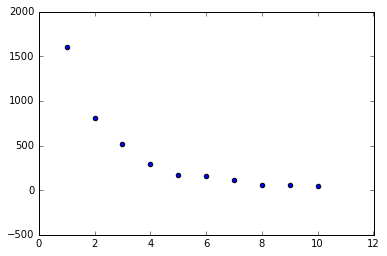

In [31]:
plt.scatter(c_slice.index.values,c_slice)
plt.show()

In [36]:
k10={k:r[0:10] for k,r in knm1.iteritems() if r is not None}

In [280]:
[v for k,v in kall10.items()]
        

[[{u'casrn': u'5837-63-8',
   u'dsstox_sid': u'DTXSID70207089',
   u'jaccard': 1.0,
   u'name': u'Maleic anhydride, dihydroxy-, dipropionate'},
  {u'casrn': u'132-82-1',
   u'dsstox_sid': u'DTXSID30157293',
   u'jaccard': 0.6176470588235294,
   u'name': u'Maleic anhydride, dihydroxy-, dibutyrate'},
  {u'casrn': u'5837-68-3',
   u'dsstox_sid': u'DTXSID40207091',
   u'jaccard': 0.5277777777777778,
   u'name': u'Maleic anhydride, dihydroxy-, bis(3-chloropropionate)'}],
 [{u'casrn': u'104-57-4',
   u'dsstox_sid': u'DTXSID5059298',
   u'jaccard': 1.0,
   u'name': u'Formic acid, phenylmethyl ester'}],
 [{u'casrn': u'13547-70-1',
   u'dsstox_sid': u'DTXSID8027749',
   u'jaccard': 1.0,
   u'name': u'1-Chloro-3,3-dimethyl-butan-2-one'}],
 [{u'casrn': u'13031-41-9',
   u'dsstox_sid': u'DTXSID8027741',
   u'jaccard': 1.0,
   u'name': u'Benzonitrile, 4-(acetyloxy)-'}],
 [{u'casrn': u'119-15-3',
   u'dsstox_sid': u'DTXSID4025161',
   u'jaccard': 1.0,
   u'name': u'4-(2,4-Dinitroanilino)phenol'}],
 

In [157]:
kall10={k:r[0:10] for k,r in kn.iteritems() if r is not None}

In [291]:
kall10.items()[0]

('DTXSID70207089',
 [{u'casrn': u'5837-63-8',
   u'dsstox_sid': u'DTXSID70207089',
   u'jaccard': 1.0,
   u'name': u'Maleic anhydride, dihydroxy-, dipropionate'},
  {u'casrn': u'132-82-1',
   u'dsstox_sid': u'DTXSID30157293',
   u'jaccard': 0.6176470588235294,
   u'name': u'Maleic anhydride, dihydroxy-, dibutyrate'},
  {u'casrn': u'5837-68-3',
   u'dsstox_sid': u'DTXSID40207091',
   u'jaccard': 0.5277777777777778,
   u'name': u'Maleic anhydride, dihydroxy-, bis(3-chloropropionate)'}])

In [188]:
kall10.values()[0][0][u'dsstox_sid']

u'DTXSID70207089'

In [247]:
a = {k:len(v) for k,v in kall10.items()}
a_df = pd.DataFrame({'ID' : a.keys(), '#NN': a.values()})

In [301]:
[v for v in kall10.values()]

[[{u'casrn': u'5837-63-8',
   u'dsstox_sid': u'DTXSID70207089',
   u'jaccard': 1.0,
   u'name': u'Maleic anhydride, dihydroxy-, dipropionate'},
  {u'casrn': u'132-82-1',
   u'dsstox_sid': u'DTXSID30157293',
   u'jaccard': 0.6176470588235294,
   u'name': u'Maleic anhydride, dihydroxy-, dibutyrate'},
  {u'casrn': u'5837-68-3',
   u'dsstox_sid': u'DTXSID40207091',
   u'jaccard': 0.5277777777777778,
   u'name': u'Maleic anhydride, dihydroxy-, bis(3-chloropropionate)'}],
 [{u'casrn': u'104-57-4',
   u'dsstox_sid': u'DTXSID5059298',
   u'jaccard': 1.0,
   u'name': u'Formic acid, phenylmethyl ester'}],
 [{u'casrn': u'13547-70-1',
   u'dsstox_sid': u'DTXSID8027749',
   u'jaccard': 1.0,
   u'name': u'1-Chloro-3,3-dimethyl-butan-2-one'}],
 [{u'casrn': u'13031-41-9',
   u'dsstox_sid': u'DTXSID8027741',
   u'jaccard': 1.0,
   u'name': u'Benzonitrile, 4-(acetyloxy)-'}],
 [{u'casrn': u'119-15-3',
   u'dsstox_sid': u'DTXSID4025161',
   u'jaccard': 1.0,
   u'name': u'4-(2,4-Dinitroanilino)phenol'}],
 

In [311]:
df_gp2 = pd.DataFrame([{'target': k, 'dtxsid': i['dsstox_sid']} for k, row in kall10.items() for i in row])

In [313]:
df_gp2.head()

,dtxsid,target
0,DTXSID70207089,DTXSID70207089
1,DTXSID30157293,DTXSID70207089
2,DTXSID40207091,DTXSID70207089
3,DTXSID5059298,DTXSID5059298
4,DTXSID8027749,DTXSID8027749


In [248]:
b = pd.DataFrame([i for row in kall10.values() for i in row])

In [260]:
b.head()

,casrn,dsstox_sid,jaccard,name
0,5837-63-8,DTXSID70207089,1.000000,"Maleic anhydride, dihydroxy-, dipropionate"
1,132-82-1,DTXSID30157293,0.617647,"Maleic anhydride, dihydroxy-, dibutyrate"
2,5837-68-3,DTXSID40207091,0.527778,"Maleic anhydride, dihydroxy-, bis(3-chloroprop..."
3,104-57-4,DTXSID5059298,1.000000,"Formic acid, phenylmethyl ester"
4,13547-70-1,DTXSID8027749,1.000000,"1-Chloro-3,3-dimethyl-butan-2-one"


In [315]:
writer = pd.ExcelWriter('/share/home3/gpatlewi/python/GenRA_George/genra-analysis/notebooks/rax/k10all_4TB_v2.xlsx',engine='xlsxwriter')
df_gp2.to_excel(writer)
writer.save()

In [34]:
def mean(numbers):
    return sum(numbers)/len(numbers)

In [40]:
av_sim={sid:mean([neighbor['jaccard'] for neighbor in neighborhood]) for sid,neighborhood in k10.iteritems()}
k={sid:len(neighborhood) for sid,neighborhood in k10.iteritems()}

In [41]:
def predict(df,col_name,list_of_neighborhoods):
    predictions={}
    for sid,neighborhood in list_of_neighborhoods.iteritems():
        neighborhood=pd.DataFrame(neighborhood)
        neighbor_data=neighborhood.merge(df,left_on='dsstox_sid',right_index=True)
        prediction=np.average(neighbor_data[col_name],weights=neighbor_data['jaccard'])
        predictions[sid]=prediction
    return predictions

In [42]:
ld50_predictions=predict(df,'LD50_mgkg',k10)

In [43]:
ld50lm_predictions=predict(df,'LD50_LM',k10)

In [44]:
dfr=df.copy()
dfr['LD50_p']=dfr.index.to_series().map(ld50_predictions)
dfr['LD50_LM_p']=dfr.index.to_series().map(ld50lm_predictions)
dfr['av_sim']=dfr.index.to_series().map(av_sim)
dfr['k']=dfr.index.to_series().map(k)

In [45]:
dfr=dfr[dfr.notnull().all(axis=1)]

In [46]:
dfr.head()

,very_toxic,nontoxic,LD50_mgkg,EPA_category,GHS_category,casrn,mol_weight,LD50_LM,LD50_p,LD50_LM_p,av_sim,k
dsstox_sid,,,,,,,,,,,,
DTXSID5020281,False,False,460.0,2.0,4.0,100-00-5,157.550003,-0.465339,170.000000,-0.087091,0.517241,1.0
DTXSID0021834,False,False,170.0,2.0,3.0,100-02-7,139.110001,-0.087091,460.000000,-0.465339,0.517241,1.0
DTXSID9059208,False,True,2300.0,3.0,5.0,100-17-4,153.136993,-1.176648,933.845064,0.556286,0.523703,4.0
DTXSID7026653,False,True,2500.0,3.0,5.0,100-20-9,203.020004,-1.090401,4920.535661,-1.356879,0.565084,4.0
DTXSID6026080,False,False,1960.0,3.0,4.0,100-21-0,166.132004,-1.071803,2139.666693,-1.030646,0.555991,5.0


In [59]:
new = []
for x,y in list(zip(dfr['LD50_LM_p'],dfr['mol_weight'])):
     new.append((10**(-x))*y)
dfr['pred_LD50'] = new
#[e for e in dfr['LD50_LM_p']]

In [60]:
dfr.head()

,very_toxic,nontoxic,LD50_mgkg,EPA_category,GHS_category,casrn,mol_weight,LD50_LM,LD50_p,LD50_LM_p,av_sim,k,pred_LD50
dsstox_sid,,,,,,,,,,,,,
DTXSID5020281,False,False,460.0,2.0,4.0,100-00-5,157.550003,-0.465339,170.000000,-0.087091,0.517241,1.0,192.534688
DTXSID0021834,False,False,170.0,2.0,3.0,100-02-7,139.110001,-0.087091,460.000000,-0.465339,0.517241,1.0,406.160578
DTXSID9059208,False,True,2300.0,3.0,5.0,100-17-4,153.136993,-1.176648,933.845064,0.556286,0.523703,4.0,42.539693
DTXSID7026653,False,True,2500.0,3.0,5.0,100-20-9,203.020004,-1.090401,4920.535661,-1.356879,0.565084,4.0,4617.611679
DTXSID6026080,False,False,1960.0,3.0,4.0,100-21-0,166.132004,-1.071803,2139.666693,-1.030646,0.555991,5.0,1782.787488


In [61]:
# Create a Pandas Excel writer using XlsxWriter as the engine.
writer = pd.ExcelWriter('/share/home3/gpatlewi/python/Unilever/acute/acute_helman_genra.xlsx', engine='xlsxwriter')

# Convert the dataframe to an XlsxWriter Excel object.
dfr.to_excel(writer, sheet_name='acute')

In [4]:
xls = pd.ExcelFile('/share/home3/gpatlewi/python/Unilever/acute/acute_helman_genra.xlsx')

In [5]:
xls.sheet_names

['acute']

In [6]:
dfr = xls.parse(u'acute')

In [7]:
dfr['av_sim'].min()

0.5

In [8]:
dfr.set_index('dsstox_sid', inplace = True)

(array([ 356.,  230.,  232.,  264.,  234.,  188.,  212.,  171.,  179.,
         160.,  170.,  128.,  121.,  103.,  102.,   98.,   77.,   60.,
          61.,   52.,   50.,   52.,   47.,   39.,   38.,   63.,   42.,
          19.,   25.,   18.,   32.,   14.,   12.,   12.,   13.,   16.,
           9.,   15.,   17.,    6.,    7.,    4.,   10.,    3.,   10.,
          12.,   22.,   82.,   34.,   77.]),
 array([ 0.5 ,  0.51,  0.52,  0.53,  0.54,  0.55,  0.56,  0.57,  0.58,
         0.59,  0.6 ,  0.61,  0.62,  0.63,  0.64,  0.65,  0.66,  0.67,
         0.68,  0.69,  0.7 ,  0.71,  0.72,  0.73,  0.74,  0.75,  0.76,
         0.77,  0.78,  0.79,  0.8 ,  0.81,  0.82,  0.83,  0.84,  0.85,
         0.86,  0.87,  0.88,  0.89,  0.9 ,  0.91,  0.92,  0.93,  0.94,
         0.95,  0.96,  0.97,  0.98,  0.99,  1.  ]),
 <a list of 50 Patch objects>)

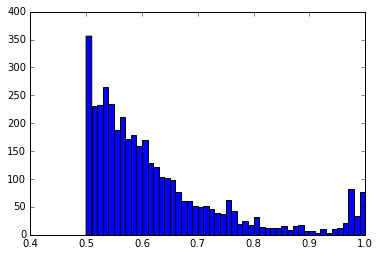

In [21]:


plt.hist(dfr['av_sim'].dropna(),bins=50)

In [10]:
from sklearn.metrics import r2_score

<h3>No log</h3>

In [23]:
r2_score(dfr['LD50_mgkg'],dfr['LD50_p'])

0.16210933588062604

<h3>Log Molar</h3>

In [11]:
r2_score(dfr['LD50_LM'],dfr['LD50_LM_p'])

0.6102458675280056

In [12]:
'RMSE is ' + str(np.sqrt(((dfr['LD50_LM']-dfr['LD50_LM_p'])**2).mean()))

'RMSE is 0.5807358596526728'

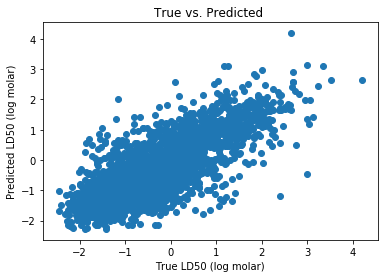

In [15]:
plt.scatter(dfr['LD50_LM'],dfr['LD50_LM_p'])
plt.title('True vs. Predicted ')
plt.ylabel('Predicted LD50 (log molar)')
plt.xlabel('True LD50 (log molar)')
plt.show()

In [16]:
dfr['residual']=(dfr['LD50_LM_p']-dfr['LD50_LM'])
dfr['mse']=(dfr['LD50_LM']-dfr['LD50_LM_p'])**2

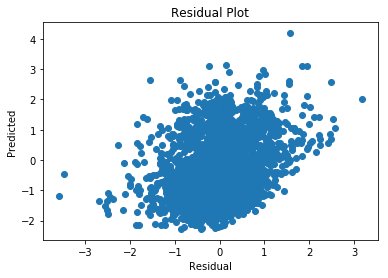

In [17]:
plt.scatter(dfr['residual'],dfr['LD50_LM_p'])
plt.title("Residual Plot")
plt.ylabel('Predicted')
plt.xlabel('Residual')
plt.show()

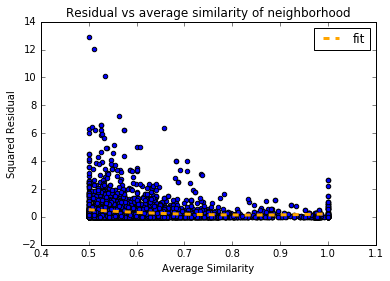

In [32]:
from sklearn.linear_model import LinearRegression
plt.scatter(dfr['av_sim'],dfr['mse'],label="")
plt.title("Residual vs average similarity of neighborhood")
plt.xlabel('Average Similarity')
plt.ylabel('Squared Residual')

X=np.array([dfr['av_sim']**i for i in range(0,3)]).T
order3=LinearRegression()
order3.fit(X,dfr['mse'])
x_space=np.linspace(.5,1,100)
x_dummy=np.array([x_space**i for i in range(0,3)]).T
plt.plot(x_space,order3.predict(x_dummy),color='orange',linestyle='--',linewidth=3, label='fit')
plt.legend(loc='best')
plt.show()

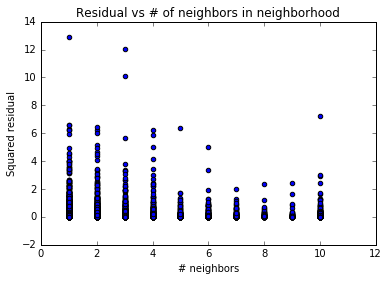

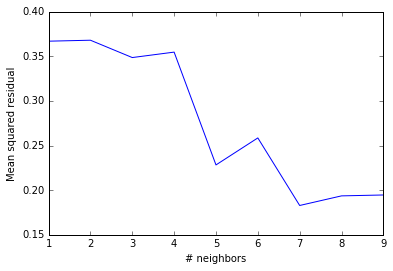

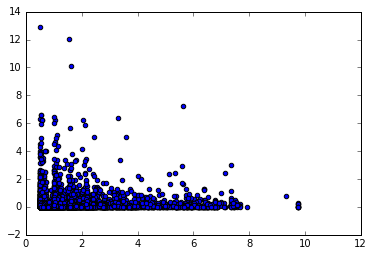

In [35]:
plt.scatter(dfr['k'],(dfr['mse']))
plt.title("Residual vs # of neighbors in neighborhood")
plt.xlabel('# neighbors')
plt.ylabel('Squared residual')
plt.show()
msrs=[]
for i in range(1,10):
    df_temp=dfr[dfr['k']==i]
    msr=mean((df_temp['LD50_LM']-df_temp['LD50_LM_p'])**2)
    msrs.append(msr)
plt.plot(range(1,10),msrs)
plt.xlabel('# neighbors')
plt.ylabel('Mean squared residual')
plt.show()

plt.scatter(dfr['k']*dfr['av_sim'],dfr['mse'])
plt.show()

<h1>Create null distribution for R2</h1>

In [63]:
df_null=df.drop('casrn',axis=1) #Would be confusing, since will no longer match sids

In [64]:
def shuffle(df):
    index=df.index
    df_samp=df.sample(frac=1)
    df_samp.index=index
    return df_samp

In [ ]:
r2s=[]
for i in range(0,1000):
    df_shuffle=shuffle(df_null)
    ld50lm_predictions=predict(df_shuffle,'LD50_LM',k10)
    df_shuffle_results=df.copy()
    df_shuffle_results['LD50_LM_p']=df_shuffle_results.index.to_series().map(ld50lm_predictions)
    df_shuffle_results=df_shuffle_results[df_shuffle_results.notnull().all(axis=1)]
    r2s.append(r2_score(df_shuffle_results['LD50_LM'],df_shuffle_results['LD50_LM_p']))

In [ ]:
r2s

In [ ]:
plt.hist(r2s)
plt.show()

In [ ]:
plt.scatter(df_shuffle_results['LD50_LM_p'],df_shuffle_results['LD50_LM'])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()
plt.scatter(df_shuffle_results['LD50_LM_p'],(df_shuffle_results['LD50_LM_p']-df_shuffle_results['LD50_LM']))
plt.xlabel('Predicted')
plt.ylabel('Residual')
plt.show()
plt.hist((df_shuffle_results['LD50_LM_p']-df_shuffle_results['LD50_LM']))
plt.show()
plt.hist((df_shuffle_results['LD50_LM']-ybar))
plt.show()

In [ ]:
'SSR: ' + str(sum((df_shuffle_results['LD50_LM_p']-df_shuffle_results['LD50_LM'])**2))
'SSE: ' + str(sum((df_shuffle_results['LD50_LM']-ybar)**2))

<h1>Train test splits</h1>

In [36]:
from sklearn.model_selection import train_test_split

In [92]:
def predict(ndf,k):
    predictions={}
    for sid,group in ndf.groupby(['target_sid']):
            neighborhood=group.iloc[0:k]
            neighbor_data=neighborhood.merge(df,left_on='neighbor_sid',right_index=True)
            prediction=np.average(neighbor_data['LD50_LM'],weights=neighbor_data['jaccard'])
            predictions[sid]=prediction
    return predictions

In [93]:
sids=list(df.index)
neighbors_l=[]
for sid in sids:
    sid_neighbors=searchCollByFP(sid,s0=.5,SID=sids,DB=DB)
    if sid_neighbors:
        for neighbor in sid_neighbors:
            neighbor['target_sid']=sid
            neighbor['neighbor_sid']=neighbor.pop('dsstox_sid')
        neighbors_l=neighbors_l+sid_neighbors

In [94]:
neighbors=pd.DataFrame(neighbors_l)
neighbors=neighbors[neighbors['target_sid']!=neighbors['neighbor_sid']]
neighbors.to_csv(DAT_DIR+'acute_tox_neighbors',encoding='utf-8')

In [95]:
neighbors.head()

,casrn,jaccard,name,neighbor_sid,target_sid
1,100-02-7,0.517241,4-Nitrophenol,DTXSID0021834,DTXSID5020281
4,100-00-5,0.517241,1-Chloro-4-nitrobenzene,DTXSID5020281,DTXSID0021834
8,100-29-8,0.542857,1-Ethoxy-4-nitrobenzene,DTXSID7026655,DTXSID9059208
9,950-35-6,0.526316,Methylparaoxon,DTXSID5037571,DTXSID9059208
10,298-00-0,0.512821,Methyl parathion,DTXSID1020855,DTXSID9059208


In [96]:
test_r2s=[]
for i in range(0,100): 
    train,test=train_test_split(df)
    kn_test={}
    train_sids=list(train.index.unique())
    test_sids=list(test.index.unique())
    test_neighbors=neighbors[(neighbors['target_sid'].isin(test_sids)) & (neighbors['neighbor_sid'].isin(train_sids))]
    ld50lm_test_predictions=predict(test_neighbors,10)

    test['LD50_LM_p']=test.index.to_series().map(ld50lm_test_predictions)
    test=test[test['LD50_LM_p'].notnull()]
    test_r2s.append(r2_score(test['LD50_LM_p'],test['LD50_LM']))
    i+=1

/share/home3/gpatlewi/anaconda3/envs/py27/lib/python2.7/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  # Remove the CWD from sys.path while we load stuff.


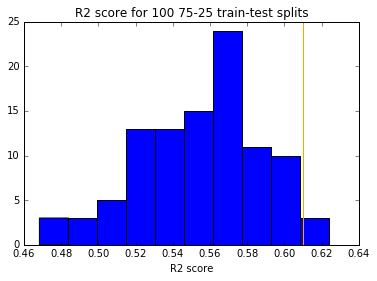

In [97]:
plt.hist(test_r2s)
plt.axvline(x=r2_score(dfr['LD50_LM'],dfr['LD50_LM_p']),color='orange',label='Full Dataset')
plt.xlabel('R2 score')
plt.title('R2 score for 100 75-25 train-test splits')
plt.show()

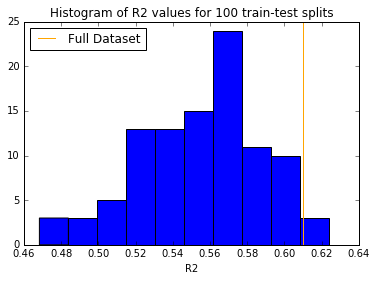

In [98]:
plt.hist(test_r2s)
full_r2=r2_score(dfr['LD50_LM'],dfr['LD50_LM_p'])
plt.axvline(full_r2,color='orange',label="Full Dataset")
plt.title("Histogram of R2 values for 100 train-test splits")
plt.xlabel('R2')
plt.legend(loc='best')
plt.show()

In [99]:
max(test_r2s)

0.62401038276874277

<h1>Permute Data Set</h1>

In [809]:
def permute_df(df,col_name,permutation):
    col=list(df[col_name])
    df=df.reindex(permutation)
    df[col_name]=col
    return df

In [814]:
from itertools import permutations
def predict_permutations(df,col_name,list_of_neighborhoods):
    predictions={}
    for sid,neighborhood in list_of_neighborhoods.iteritems():
        neighborhood=pd.DataFrame(neighborhood)
        neighbor_data=neighborhood.merge(df,left_on='dsstox_sid',right_index=True)
        for permutation in permutations(neighbor_data.index.values):    
            neighbor_data=permute_df(neighbor_data,'LD50_LM',permutation)
            prediction=np.average(neighbor_data[col_name],weights=neighbor_data['jaccard'])
            if sid in predictions:
                predictions[sid].append(prediction)
            else:
                predictions[sid]=[prediction]
    return predictions

In [802]:
k10_sub={}
i=0
for sid,neighborhood in k10.iteritems():
    if(i>=2):break
    k10_sub[sid]=neighborhood
    i+=1

In [ ]:
k10_sub

In [815]:
ld50lm_perm_predict=predict_permutations(df,'LD50_LM',k10_sub)

In [ ]:
ld50lm_perm_predict=predict_permutations(df,'LD50_LM',k10)

<h1>Cherry pick examples</h1>

In [832]:
dfr['mse']=(dfr['LD50_LM']-dfr['LD50_LM_p'])**2
dfr=dfr.sort_values('mse')
dfr[dfr['mse']==0]

,very_toxic,nontoxic,LD50_mgkg,EPA_category,GHS_category,casrn,mol_weight,LD50_LM,LD50_p,LD50_LM_p,av_sim,k,LD50_median_p,mse
dsstox_sid,,,,,,,,,,,,,,
DTXSID1020853,False,False,600.0,3.0,4.0,36702-44-0,128.175003,-0.670348,600.0,-0.670348,1.0,1.0,-0.670348,0.0
DTXSID00200447,False,False,1840.0,3.0,4.0,52447-11-7,323.820007,-0.754514,1840.0,-0.754514,1.0,1.0,-0.754514,0.0
DTXSID4022313,False,False,880.0,3.0,4.0,3424-82-6,318.019989,-0.442028,880.0,-0.442028,0.5,1.0,-0.442028,0.0
DTXSID2025975,False,False,470.0,2.0,4.0,89-82-7,152.237000,-0.489578,470.0,-0.489578,1.0,1.0,-0.489578,0.0
DTXSID8045438,False,False,1840.0,3.0,4.0,23239-51-2,323.820007,-0.754514,1840.0,-0.754514,1.0,1.0,-0.754514,0.0
DTXSID9020374,False,False,880.0,3.0,4.0,72-55-9,318.019989,-0.442028,880.0,-0.442028,0.5,1.0,-0.442028,0.0
DTXSID3051757,False,False,470.0,2.0,4.0,15932-80-6,152.237000,-0.489578,470.0,-0.489578,1.0,1.0,-0.489578,0.0
DTXSID6020852,False,False,600.0,3.0,4.0,14026-03-0,128.175003,-0.670348,600.0,-0.670348,1.0,1.0,-0.670348,0.0


In [961]:
dfr[dfr['av_sim']==1]

,very_toxic,nontoxic,LD50_mgkg,EPA_category,GHS_category,casrn,mol_weight,LD50_LM,LD50_p,LD50_LM_p,av_sim,k,LD50_median_p,mse,residual
dsstox_sid,,,,,,,,,,,,,,,
DTXSID1020853,False,False,600.0,3.0,4.0,36702-44-0,128.175003,-0.670348,600.00,-0.670348,1.0,1.0,-0.670348,0.000000e+00,0.000000e+00
DTXSID00200447,False,False,1840.0,3.0,4.0,52447-11-7,323.820007,-0.754514,1840.00,-0.754514,1.0,1.0,-0.754514,0.000000e+00,0.000000e+00
DTXSID2025975,False,False,470.0,2.0,4.0,89-82-7,152.237000,-0.489578,470.00,-0.489578,1.0,1.0,-0.489578,0.000000e+00,0.000000e+00
DTXSID8045438,False,False,1840.0,3.0,4.0,23239-51-2,323.820007,-0.754514,1840.00,-0.754514,1.0,1.0,-0.754514,0.000000e+00,0.000000e+00
DTXSID3051757,False,False,470.0,2.0,4.0,15932-80-6,152.237000,-0.489578,470.00,-0.489578,1.0,1.0,-0.489578,0.000000e+00,0.000000e+00
DTXSID6020852,False,False,600.0,3.0,4.0,14026-03-0,128.175003,-0.670348,600.00,-0.670348,1.0,1.0,-0.670348,0.000000e+00,0.000000e+00
DTXSID90892072,False,True,3075.0,3.0,5.0,17293-03-7,229.910000,-1.126287,3075.00,-1.126287,1.0,1.0,-1.126287,4.785370e-17,6.917637e-09
DTXSID7042487,False,True,3075.0,3.0,5.0,1344-32-7,229.910004,-1.126287,3075.00,-1.126287,1.0,1.0,-1.126287,4.785370e-17,-6.917637e-09
DTXSID7041253,False,True,3543.0,3.0,5.0,95-96-5,144.126007,-1.390629,3543.00,-1.390629,1.0,1.0,-1.390629,4.551558e-16,-2.133438e-08


Most perfect predictions are diastereomer pairs with single chemical neighborhoods. DTXSID4022313 only exception with single structural isomer.

In [833]:
dfr[dfr['mse']>0]

,very_toxic,nontoxic,LD50_mgkg,EPA_category,GHS_category,casrn,mol_weight,LD50_LM,LD50_p,LD50_LM_p,av_sim,k,LD50_median_p,mse
dsstox_sid,,,,,,,,,,,,,,
DTXSID90892072,False,True,3075.000,3.0,5.0,17293-03-7,229.910000,-1.126287,3075.000000,-1.126287,1.000000,1.0,-1.126287,4.785370e-17
DTXSID7042487,False,True,3075.000,3.0,5.0,1344-32-7,229.910004,-1.126287,3075.000000,-1.126287,1.000000,1.0,-1.126287,4.785370e-17
DTXSID7041253,False,True,3543.000,3.0,5.0,95-96-5,144.126007,-1.390629,3543.000000,-1.390629,1.000000,1.0,-1.390629,4.551558e-16
DTXSID10873989,False,True,3543.000,3.0,5.0,13076-17-0,144.126000,-1.390629,3543.000000,-1.390629,1.000000,1.0,-1.390629,4.551558e-16
DTXSID30208037,False,False,196.000,2.0,3.0,593-82-8,96.559998,-0.307459,122.000000,-0.307485,0.857143,1.0,-0.307485,7.046079e-10
DTXSID1020516,False,False,122.000,2.0,3.0,57-14-7,60.099998,-0.307485,196.000000,-0.307459,0.857143,1.0,-0.307459,7.046079e-10
DTXSID00236766,False,True,2001.000,3.0,5.0,88045-98-1,337.367615,-0.773144,2001.000000,-0.773085,0.749400,2.0,-0.774650,3.501187e-09
DTXSID1021118,False,False,472.000,2.0,4.0,136-40-3,249.699997,-0.276523,403.000000,-0.276428,0.973684,1.0,-0.276428,9.071138e-09
DTXSID1023445,False,False,403.000,2.0,4.0,94-78-0,213.244003,-0.276428,472.000000,-0.276523,0.973684,1.0,-0.276523,9.071138e-09


DTXSID40110056 possibly interesting. Target and all 3 analogues are all cinnamon related.

DTXSID70237669 possibly interesting. All 4 Neighbors seemingly more related to each other than target.

DTXSID90198546 is full neighborhood of carbamaric acid variations (target is also)

DTXSID2026107 is full neighborhood of acrylates (target is also)

In [174]:
k10['DTXSID2026107']

[{u'casrn': u'1680-21-3',
  u'dsstox_sid': u'DTXSID0051780',
  u'jaccard': 1.0,
  u'name': u'Triethylene glycol diacrylate'},
 {u'casrn': u'4074-88-8',
  u'dsstox_sid': u'DTXSID3025045',
  u'jaccard': 0.9583333333333334,
  u'name': u'Diethylene glycol diacrylate'},
 {u'casrn': u'106-74-1',
  u'dsstox_sid': u'DTXSID3051545',
  u'jaccard': 0.7333333333333333,
  u'name': u'2-Ethoxyethyl acrylate'},
 {u'casrn': u'2274-11-5',
  u'dsstox_sid': u'DTXSID9044615',
  u'jaccard': 0.72,
  u'name': u'Ethylene acrylate'},
 {u'casrn': u'3121-61-7',
  u'dsstox_sid': u'DTXSID7025554',
  u'jaccard': 0.6333333333333333,
  u'name': u'2-Methoxyethyl acrylate'},
 {u'casrn': u'818-61-1',
  u'dsstox_sid': u'DTXSID2022123',
  u'jaccard': 0.5333333333333333,
  u'name': u'2-Hydroxyethyl acrylate'},
 {u'casrn': u'1070-70-8',
  u'dsstox_sid': u'DTXSID6044779',
  u'jaccard': 0.5333333333333333,
  u'name': u'1,4-Butanediol diacrylate'},
 {u'casrn': u'2206-89-5',
  u'dsstox_sid': u'DTXSID8024783',
  u'jaccard': 0.516

In [173]:
df.loc[[record['dsstox_sid'] for record in k10['DTXSID2026107']]]

,very_toxic,nontoxic,LD50_mgkg,EPA_category,GHS_category,casrn,mol_weight,LD50_LM
dsstox_sid,,,,,,,,
DTXSID0051780,False,False,500.0,2.0,4.0,1680-21-3,258.269989,-0.286896
DTXSID3025045,False,False,250.0,2.0,3.0,4074-88-8,214.216995,-0.067086
DTXSID3051545,False,False,1070.0,3.0,4.0,106-74-1,144.169998,-0.870509
DTXSID9044615,False,False,300.0,2.0,4.0,2274-11-5,170.164001,-0.246254
DTXSID7025554,False,False,404.0,2.0,4.0,3121-61-7,130.143005,-0.491961
DTXSID2022123,False,False,548.0,3.0,4.0,818-61-1,116.115997,-0.673889
DTXSID6044779,False,False,587.0,3.0,4.0,1070-70-8,198.218002,-0.471495
DTXSID8024783,False,False,180.0,2.0,3.0,2206-89-5,134.559998,-0.126357
DTXSID6024676,False,False,900.0,3.0,4.0,141-32-2,128.171005,-0.846453


In [842]:
dfr[(dfr['mse']<.011) & (dfr['mse']>.009)]

,very_toxic,nontoxic,LD50_mgkg,EPA_category,GHS_category,casrn,mol_weight,LD50_LM,LD50_p,LD50_LM_p,av_sim,k,LD50_median_p,mse
dsstox_sid,,,,,,,,,,,,,,
DTXSID2034255,True,False,5.75,1.0,2.0,640-19-7,77.057999,1.127150,4.680000,1.222083,0.500000,1.0,1.222083,0.009012
DTXSID0041981,True,False,4.68,1.0,1.0,144-49-0,78.042000,1.222083,5.750000,1.127150,0.500000,1.0,1.127150,0.009012
DTXSID6035156,False,True,4000.00,3.0,5.0,122-70-3,178.231003,-1.351077,6291.502036,-1.446127,0.572005,7.0,-1.355136,0.009035
DTXSID6048250,False,False,983.00,3.0,4.0,128298-28-2,268.359985,-0.563836,897.000000,-0.468749,0.976744,1.0,-0.468749,0.009041
DTXSID9045683,False,False,897.00,3.0,4.0,111686-79-4,304.820007,-0.468749,983.000000,-0.563836,0.976744,1.0,-0.563836,0.009041
DTXSID1021087,False,True,5001.00,4.0,5.0,604-75-1,286.720001,-1.241599,4500.000000,-1.146491,0.621212,1.0,-1.146491,0.009045
DTXSID2047199,False,True,2600.00,3.0,5.0,2785-87-7,166.220001,-1.194290,2284.625056,-1.099160,0.562374,2.0,-1.096738,0.009050
DTXSID0020280,False,False,251.00,2.0,3.0,88-73-3,157.550003,-0.202255,381.000000,-0.297624,0.500000,1.0,-0.297624,0.009095
DTXSID0021888,False,False,1600.00,3.0,4.0,107-87-9,86.134003,-1.268945,2393.169489,-1.364568,0.549611,6.0,-1.340158,0.009144


DTXSID6035156 for neighborhood of 7 propanoates (target is also)

DTXSID9026926 is full neighborhood of alcohols (target is 1-tetradecanol)

DTXSID106115 is full neighborhood of organic salts (target is also)

In [922]:
dfr[(dfr['mse']<.02) & (dfr['mse']>.01)]

,very_toxic,nontoxic,LD50_mgkg,EPA_category,GHS_category,casrn,mol_weight,LD50_LM,LD50_p,LD50_LM_p,av_sim,k,LD50_median_p,mse,residual
dsstox_sid,,,,,,,,,,,,,,,
DTXSID40195106,True,False,3.285,1.0,1.0,4228-88-0,255.020004,1.890039,6.616341,1.790027,0.564908,10.0,1.690049,0.010002,-0.100012
DTXSID00186010,False,False,1300.000,3.0,4.0,3226-32-2,178.274994,-0.862853,1299.056078,-0.762787,0.674231,6.0,-0.627478,0.010013,0.100066
DTXSID1059448,False,True,2357.000,3.0,5.0,117-14-6,368.329987,-0.806123,1870.000000,-0.705605,0.714286,1.0,-0.705605,0.010104,0.100518
DTXSID7022251,False,True,2100.000,3.0,5.0,10031-82-0,150.177002,-1.145616,1510.000000,-1.044959,0.515152,1.0,-1.044959,0.010132,0.100657
DTXSID60198553,True,False,25.000,1.0,2.0,50539-73-6,363.859985,1.162994,55.963999,1.062296,0.704848,3.0,1.213050,0.010140,-0.100698
DTXSID7048663,False,True,11300.000,4.0,5.0,10040-45-6,481.399994,-1.370572,6297.863248,-1.269863,0.531818,2.0,-1.282232,0.010142,0.100710
DTXSID0047115,False,True,3700.000,3.0,5.0,459-80-3,168.235992,-1.342283,3500.000000,-1.443012,0.516129,1.0,-1.443012,0.010146,-0.100729
DTXSID9048481,False,False,850.000,3.0,4.0,13473-38-6,354.468994,-0.379841,821.975167,-0.279093,0.758207,3.0,-0.246796,0.010150,0.100747
DTXSID5021914,False,True,2542.000,3.0,5.0,110-12-3,114.188004,-1.347555,2050.000000,-1.246697,0.545455,1.0,-1.246697,0.010172,0.100858


DTXSID3058082 for prediction with MSE=.02

In [848]:
dfr_bad=dfr.sort_values('mse',ascending=False)
dfr_bad

,very_toxic,nontoxic,LD50_mgkg,EPA_category,GHS_category,casrn,mol_weight,LD50_LM,LD50_p,LD50_LM_p,av_sim,k,LD50_median_p,mse
dsstox_sid,,,,,,,,,,,,,,
DTXSID6058136,True,False,1.000,1.0,1.0,5836-73-7,249.110001,2.396391,5001.000000,-1.193920,0.500000,1.0,-1.193920,1.289034e+01
DTXSID8024311,True,False,0.100,1.0,1.0,62-74-8,100.024002,3.000104,2514.130435,-0.469831,0.511111,3.0,0.185438,1.204045e+01
DTXSID30237685,False,True,3955.000,3.0,5.0,89427-25-8,280.033478,-1.149937,3.007388,2.026898,0.534865,3.0,2.080067,1.009228e+01
DTXSID4044870,True,False,10.066,1.0,2.0,2082-81-7,226.272003,1.351774,9291.304463,-1.440061,0.563062,10.0,-1.583461,7.794344e+00
DTXSID8064064,False,True,10000.000,4.0,5.0,5930-71-2,314.320007,-1.502628,15.000000,1.059942,0.526316,1.0,1.059942,6.566764e+00
DTXSID2042226,True,False,15.000,1.0,2.0,2953-29-9,172.199997,1.059942,10000.000000,-1.502628,0.526316,1.0,-1.502628,6.566764e+00
DTXSID6026086,False,True,5001.000,4.0,5.0,14047-09-7,319.989990,-1.193920,46.671642,1.340234,0.507576,2.0,1.355765,6.421937e+00
DTXSID4021927,True,False,9.000,1.0,2.0,111-13-7,128.214996,1.153696,3369.355982,-1.364619,0.658038,5.0,-1.352122,6.341913e+00
DTXSID3025417,True,False,8.000,1.0,2.0,107-16-4,57.051998,0.853181,3200.000000,-1.653409,0.500000,1.0,-1.653409,6.282991e+00


DTXSID4044870 = Butane-1,4-diyl bis(2-methylprop-2-enoate). Full neighborhood of methacrylates. Is 4044870 a methacrylate?

DTXSID6058136 single chemical neighborhood, have common dichlorobenzene substructure but not very similar otherwise.

<h1>Grid Search</h1>

In [41]:
len(sids)

7011

In [42]:
kn_lowsim={}
for sid in sids:
    kn_lowsim[sid]=searchCollByFP(sid,s0=.05,SID=sids,DB=DB,max_hits=len(sids))

In [45]:
#import pickle
#with open(DAT_DIR+'acute_neighborhoods_05sim.pkl','w') as f:
#    pickle.dump(kn_lowsim,f)

In [46]:
import pickle
with open(DAT_DIR+'acute_neighborhoods_05sim.pkl','r') as f:
    kn_lowsim=pickle.load(f)
    kn_lowsim=dict(kn_lowsim)

In [48]:
no_neighbors=set(sids)-set(kn_lowsim.keys())
#no_neighbors

In [49]:
len(searchCollByFP('DTXSID4045896',s0=.05,SID=sids,DB=DB,max_hits=len(sids)))

4398

In [50]:
len(kn_lowsim)

7011

In [51]:
def set_threshhold(neighborhood,s0):
    subset=[]
    for neighbor in neighborhood:
        if neighbor['jaccard']>=s0:
            subset.append(neighbor)
        else:
            break #Use fact that return from MongoDB aggregation already ordered by similarity
    return subset
def get_thresholded_neighborhoods(dict_of_neighborhoods,s0):
    new_dict={}
    for sid,neighborhood in dict_of_neighborhoods.iteritems():
        subset=set_threshhold(neighborhood,s0)
        new_dict[sid]=subset
    return new_dict
def get_subsetted_neighborhoods(dict_of_neighborhoods,k):
    return {sid:neighborhood[0:k] for sid,neighborhood in dict_of_neighborhoods.iteritems() if neighborhood}

In [52]:
def predict(df,col_name,dict_of_neighborhoods):
    predictions={}
    for sid,neighborhood in dict_of_neighborhoods.iteritems():
        neighborhood=pd.DataFrame(neighborhood)
        neighbor_data=neighborhood.merge(df,left_on='dsstox_sid',right_index=True)
        try:
            prediction=np.average(neighbor_data[col_name],weights=neighbor_data['jaccard'])
        except:
            print(sid)
            print(neighbor_data)
            break
        predictions[sid]=prediction
    return predictions

In [53]:
s_range=[round(s*.01,2) for s in range(5,100,5)]
k_range=range(1,16)

In [56]:
knlm1=remove_target_from_neighborhoods(kn_lowsim)

In [57]:
df.head()

,very_toxic,nontoxic,LD50_mgkg,EPA_category,GHS_category,casrn,mol_weight,LD50_LM
dsstox_sid,,,,,,,,
DTXSID5020281,False,False,460.0,2.0,4.0,100-00-5,157.550003,-0.465339
DTXSID8020961,False,False,750.0,3.0,4.0,100-01-6,138.126007,-0.734786
DTXSID0021834,False,False,170.0,2.0,3.0,100-02-7,139.110001,-0.087091
DTXSID2044347,False,False,1720.0,3.0,4.0,100-06-1,150.177002,-1.058925
DTXSID4025745,False,False,1809.0,3.0,4.0,100-14-1,171.580002,-1.022972


In [58]:
results={}
for s in s_range:
    thresholded=get_thresholded_neighborhoods(knlm1,s)
    results[s]={}
    for k in k_range:  
        subset=get_subsetted_neighborhoods(thresholded,k)
        results[s][k]=predict(df,'LD50_LM',subset)

In [69]:
results

{0.05: {1: {'DTXSID70207089': -1.74434644885,
   'DTXSID5059298': -1.33125244162,
   'DTXSID8027749': -0.033764391659100002,
   'DTXSID20228365': -1.3777816646200001,
   'DTXSID4025161': 2.3067712506700007,
   'DTXSID2021151': -0.9164408102299999,
   'DTXSID2021153': -0.59875557699399995,
   'DTXSID2021159': -0.97643827384699999,
   'DTXSID90172245': -0.56532972308999996,
   'DTXSID00176097': 0.45289336313300005,
   'DTXSID4021426': -0.34505376000499999,
   'DTXSID4021395': -0.63924781807999997,
   'DTXSID4021397': -1.0274805095699999,
   'DTXSID4024143': -0.560084237436,
   'DTXSID4021393': -2.2262381392999999,
   'DTXSID2040284': -0.45986312287900005,
   'DTXSID6024464': -1.3610655902,
   'DTXSID20196398': -1.22137084496,
   'DTXSID4021399': -0.96590117865199998,
   'DTXSID90202556': 0.53314182072799998,
   'DTXSID8051677': -2.0620481813199998,
   'DTXSID8034611': -0.67574288337799993,
   'DTXSID30179415': 0.185833231776,
   'DTXSID40146133': -0.09010789176010002,
   'DTXSID7060706':

In [70]:
results[s][k]

{'DTXSID00179381': -0.52537320180699998,
 'DTXSID00199726': -0.52537320180699998,
 'DTXSID00200447': -0.75451414473800005,
 'DTXSID0020286': -0.56567493095200005,
 'DTXSID0020440': -0.38240432707700001,
 'DTXSID0021121': -0.50059845436299999,
 'DTXSID0021410': -0.426161815153,
 'DTXSID00218860': -0.74010044782000006,
 'DTXSID0022806': 0.16660770187999999,
 'DTXSID0022808': 0.39437347199199996,
 'DTXSID0022985': -0.48373824996856135,
 'DTXSID0023535': 0.0012183755789800001,
 'DTXSID0023537': -0.46267881366010521,
 'DTXSID0023666': -0.76810954140200005,
 'DTXSID0024559': -0.89062397533899995,
 'DTXSID0025818': -0.12677847285300001,
 'DTXSID0025864': -1.0784135593200002,
 'DTXSID0026701': -1.1306997624299999,
 'DTXSID0026915': -1.57853026958125,
 'DTXSID0032029': -0.94129041907000011,
 'DTXSID0033382': 0.19590459284000003,
 'DTXSID0034851': -0.16537971526599998,
 'DTXSID0034855': -0.88027825766399992,
 'DTXSID0034857': -0.59877416518299997,
 'DTXSID0041060': -0.99713876449100003,
 'DTXSID

In [130]:
sid='DTXSID2021159'
neighborhood=subset['DTXSID2021159']
neighborhood=pd.DataFrame(neighborhood)
neighbor_data=neighborhood.merge(df,left_on='dsstox_sid',right_index=True)
neighbor_data
np.average(neighbor_data['LD50_LM'],weights=neighbor_data['jaccard'])

,casrn_x,dsstox_sid,jaccard,name,very_toxic,nontoxic,LD50_mgkg,EPA_category,GHS_category,casrn_y,mol_weight,LD50_LM
1,17369-59-4,DTXSID7025972,0.394737,3-Propylidenephthalide,False,False,1650.0,3.0,4.0,17369-59-4,174.199005,-0.976438
2,81-84-5,DTXSID4026505,0.393939,"1H,3H-Naphtho(1,8-cd)pyran-1,3-dione",False,True,9600.0,4.0,5.0,81-84-5,198.177002,-1.685218
3,2421-28-5,DTXSID3029233,0.368421,Benzophenonetetracarboxylic dianhydride,False,True,12800.0,4.0,5.0,2421-28-5,322.227997,-1.599047
4,552-30-7,DTXSID7026235,0.368421,Trimellitic anhydride,False,True,2030.0,3.0,5.0,552-30-7,192.126007,-1.023910
5,551-08-6,DTXSID9060281,0.365854,"1(3H)-Isobenzofuranone, 3-butylidene-",False,False,1850.0,3.0,4.0,551-08-6,188.225998,-0.992492
6,130-15-4,DTXSID5040704,0.357143,"1,4-Naphthoquinone",False,False,190.0,2.0,3.0,130-15-4,158.156006,-0.079668
8,117-80-6,DTXSID7020425,0.333333,Dichlone,False,False,160.0,2.0,3.0,117-80-6,227.039993,0.151982
10,52671-72-4,DTXSID20276326,0.307692,"1,3-Dioxo-1H,3H-naphtho[1,8-cd]pyran-6,7-dicar...",False,True,3508.0,3.0,5.0,52671-72-4,286.193237,-1.088400
11,4053-08-1,DTXSID1063279,0.302326,4-Chloronapthalic anhydride,False,True,3460.0,3.0,5.0,4053-08-1,232.619995,-1.172429
12,128-95-0,DTXSID2041252,0.285714,"1,4-Diaminoanthraquinone",False,True,5790.0,4.0,5.0,128-95-0,238.246002,-1.385653


-1.0177233249929569

In [59]:
import pickle
with open(DAT_DIR+'grid_search.pkl','w') as f:
    pickle.dump(results,f)

In [60]:
import pickle
with open(DAT_DIR+'grid_search.pkl','r') as f:
    results=pickle.load(f)

In [61]:
from sklearn.metrics import r2_score
grid_r2s=np.empty([len(s_range),len(k_range)])
for s in s_range:
    for k in k_range:
        s_index=s_range.index(s)
        k_index=k_range.index(k)
        result=results[s][k]
        df_grid_result=df.copy()
        df_grid_result['LD50_LM_p']=df_grid_result.index.to_series().map(result)
        df_grid_result=df_grid_result[df_grid_result.notnull().all(axis=1)]
        r2=r2_score(df_grid_result['LD50_LM'],df_grid_result['LD50_LM_p'])
        grid_r2s[s_index,k_index]=r2

In [62]:
writer=pd.ExcelWriter(FIG_DIR+'results.xlsx',engine='xlsxwriter')
pd.DataFrame(grid_r2s,index=s_range,columns=k_range).to_excel(writer,sheet_name='R2 up to k neighbors')

In [63]:
pd.DataFrame(grid_r2s,index=s_range,columns=k_range)

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
0.05,0.265407,0.429875,0.473349,0.492663,0.503232,0.507365,0.510165,0.512795,0.510857,0.507881,0.505048,0.502282,0.498974,0.496361,0.493242
0.10,0.265407,0.429875,0.473349,0.492663,0.503232,0.507334,0.510159,0.512792,0.510840,0.507843,0.505001,0.502253,0.498934,0.496305,0.493189
0.15,0.265914,0.429876,0.472758,0.491565,0.502586,0.505989,0.508729,0.511166,0.510042,0.507110,0.504464,0.502061,0.499166,0.496221,0.493759
0.20,0.276775,0.435297,0.477741,0.495827,0.505842,0.509220,0.511806,0.514310,0.514355,0.512079,0.509706,0.507767,0.505403,0.503288,0.501002
0.25,0.293376,0.447487,0.487170,0.501877,0.509276,0.512542,0.514858,0.516969,0.516762,0.515316,0.513388,0.512576,0.511250,0.509416,0.507682
0.30,0.331774,0.467228,0.502723,0.513861,0.521280,0.525163,0.527235,0.529505,0.529770,0.528785,0.529148,0.529208,0.528458,0.527640,0.526739
0.35,0.373734,0.502717,0.536395,0.546879,0.551994,0.554934,0.556295,0.556771,0.556726,0.556651,0.556806,0.556656,0.556090,0.555588,0.555196
0.40,0.398579,0.508487,0.535344,0.542508,0.546899,0.549212,0.550007,0.550258,0.549823,0.550362,0.550779,0.550628,0.550616,0.550604,0.550779
0.45,0.446342,0.536983,0.561997,0.568970,0.571940,0.573082,0.574204,0.574631,0.574598,0.574794,0.574874,0.574777,0.574730,0.574687,0.574637
0.50,0.494769,0.579524,0.600762,0.605359,0.608176,0.608407,0.609445,0.610018,0.609881,0.610246,0.610280,0.610135,0.610119,0.610074,0.610025


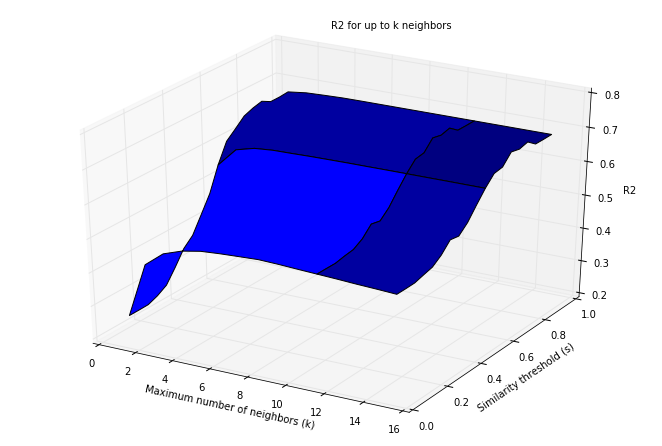

In [64]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt

fig=plt.figure(figsize=(9,6))
ax=Axes3D(fig)
ax.text2D(.5,.95,'R2 for up to k neighbors',transform=ax.transAxes)
X,Y=np.meshgrid(k_range,s_range)
ax.plot_surface(X,Y,grid_r2s)
ax.set_xlabel('Maximum number of neighbors (k)')
ax.set_ylabel('Similarity threshold (s)')
ax.set_zlabel('R2')
plt.savefig(FIG_DIR+'acute_1.png')
plt.show()

In [84]:
coverage=[]
for s in s_range:
    result=results[s][1]
    df_grid_result=df.copy()
    df_grid_result['LD50_LM_p']=df_grid_result.index.to_series().map(result)
    df_grid_result=df_grid_result[df_grid_result.notnull().all(axis=1)]
    coverage.append(len(df_grid_result)/len(df))

In [85]:
3998/9293

0.43021629183256216

In [83]:
from __future__ import division
len(df_grid_result)/len(df)

0.07274283269148481

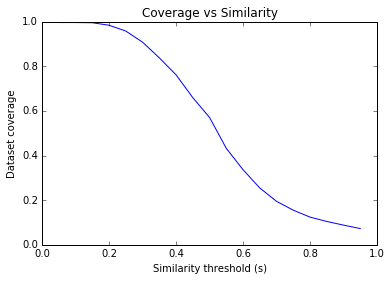

In [86]:
plt.plot(s_range,coverage)
plt.title("Coverage vs Similarity")
plt.xlabel('Similarity threshold (s)')
plt.ylabel('Dataset coverage')
plt.savefig(FIG_DIR+'acute_2.png')
plt.show()

What if number of nearest neighbors equals k instead of k just being a maximum

In [87]:
def get_full_subsetted_neighborhoods(dict_of_neighborhoods,k):
    return {sid:neighborhood[0:k] for sid,neighborhood in dict_of_neighborhoods.iteritems() if neighborhood and len(neighborhood)>=k}

In [89]:
fullk_results={}
for s in s_range:
    thresholded=get_thresholded_neighborhoods(knlm1,s)
    fullk_results[s]={}
    for k in k_range:  
        subset=get_full_subsetted_neighborhoods(thresholded,k)
        fullk_results[s][k]=predict(df,'LD50_LM',subset)

In [92]:
#import pickle
#with open(DAT_DIR+'fullk_grid_search.pkl','w') as f:
#        pickle.dump(fullk_results,f)

In [93]:
import pickle
with open(DAT_DIR+'fullk_grid_search.pkl','r') as f:
    fullk_results=pickle.load(f)

In [94]:
from sklearn.metrics import r2_score
grid_fullk_r2s=np.empty([len(s_range),len(k_range)])
for s in s_range:
    for k in k_range:
        s_index=s_range.index(s)
        k_index=k_range.index(k)
        result=fullk_results[s][k]
        df_grid_result=df.copy()
        df_grid_result['LD50_LM_p']=df_grid_result.index.to_series().map(result)
        df_grid_result=df_grid_result[df_grid_result.notnull().all(axis=1)]
        if len(df_grid_result)<=30:
            r2=None
        else:
            r2=r2_score(df_grid_result['LD50_LM'],df_grid_result['LD50_LM_p'])
        grid_fullk_r2s[s_index,k_index]=r2

In [95]:
pd.DataFrame(grid_fullk_r2s,index=s_range,columns=k_range).to_excel(writer,sheet_name='R2 exactly k neighbors',na_rep='<30')

In [96]:
pd.DataFrame(grid_fullk_r2s,index=s_range,columns=k_range)

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
0.05,0.265407,0.429875,0.473349,0.492663,0.503232,0.507365,0.510165,0.512795,0.510857,0.507881,0.505048,0.502282,0.498974,0.496361,0.493242
0.10,0.265407,0.429875,0.473349,0.492663,0.503232,0.507648,0.510474,0.513108,0.511155,0.508174,0.505296,0.502535,0.499299,0.496668,0.493601
0.15,0.265914,0.431186,0.476729,0.496742,0.508521,0.512223,0.514404,0.516702,0.515350,0.512903,0.514513,0.513699,0.511188,0.510152,0.507737
0.20,0.276775,0.441397,0.487710,0.510718,0.524044,0.528659,0.533813,0.538590,0.541500,0.540241,0.538346,0.537207,0.536237,0.533579,0.530899
0.25,0.293376,0.463680,0.516797,0.542793,0.556847,0.566066,0.572277,0.578491,0.580958,0.583692,0.585650,0.585397,0.589493,0.591531,0.592782
0.30,0.331774,0.504545,0.564157,0.584791,0.600812,0.611408,0.615719,0.624264,0.631423,0.636865,0.648344,0.649078,0.656090,0.662247,0.665214
0.35,0.373734,0.535641,0.606482,0.633130,0.644918,0.661151,0.673626,0.682607,0.691891,0.703778,0.716502,0.721285,0.723777,0.722765,0.721991
0.40,0.398579,0.574165,0.647188,0.675198,0.688735,0.701564,0.716179,0.727268,0.732000,0.746598,0.756838,0.762230,0.764151,0.771575,0.794837
0.45,0.446342,0.624881,0.691940,0.711095,0.732022,0.757878,0.773514,0.794694,0.807273,0.824572,0.813817,0.800666,0.797352,0.812906,0.822324
0.50,0.494769,0.638220,0.704153,0.742477,0.784854,0.797594,0.808258,0.806374,0.803373,0.808225,0.796152,0.826112,0.833195,0.864194,NaN


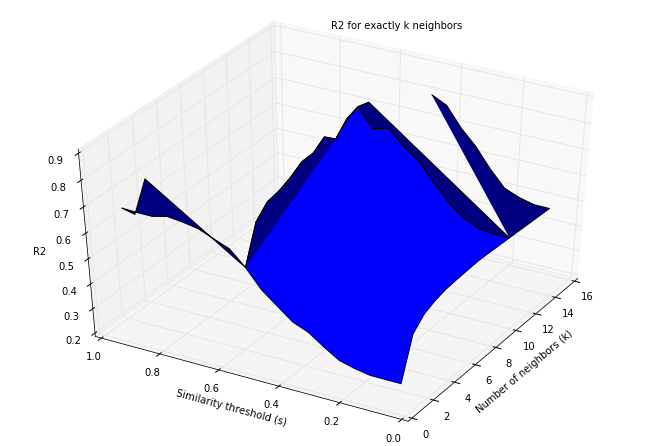

In [97]:
fig=plt.figure(figsize=(9,6))
ax=Axes3D(fig)
ax.text2D(.5,.95,'R2 for exactly k neighbors',transform=ax.transAxes)
X,Y=np.meshgrid(k_range,s_range)
ax.plot_surface(X,Y,np.array(grid_fullk_r2s))
ax.view_init(40,210)
ax.set_xlabel('Number of neighbors (k)')
ax.set_ylabel('Similarity threshold (s)')
ax.set_zlabel('R2')
plt.savefig(FIG_DIR+'acute_3.png')
plt.show()

In [98]:
fullk_coverage=np.empty([len(s_range),len(k_range)])
for s in s_range:
    for k in k_range:
        s_index=s_range.index(s)
        k_index=k_range.index(k)
        result=fullk_results[s][k]
        df_grid_result=df.copy()
        df_grid_result['LD50_LM_p']=df_grid_result.index.to_series().map(result)
        df_grid_result=df_grid_result[df_grid_result.notnull().all(axis=1)]
        fullk_coverage[s_index,k_index]=len(df_grid_result)

In [99]:
fullk_results[.05][1]

{'DTXSID70207089': -1.74434644885,
 'DTXSID5059298': -1.33125244162,
 'DTXSID8027749': -0.033764391659100002,
 'DTXSID20228365': -1.3777816646200001,
 'DTXSID4025161': 2.3067712506700007,
 'DTXSID2021151': -0.9164408102299999,
 'DTXSID2021153': -0.59875557699399995,
 'DTXSID2021159': -0.97643827384699999,
 'DTXSID90172245': -0.56532972308999996,
 'DTXSID00176097': 0.45289336313300005,
 'DTXSID4021426': -0.34505376000499999,
 'DTXSID4021395': -0.63924781807999997,
 'DTXSID4021397': -1.0274805095699999,
 'DTXSID4024143': -0.560084237436,
 'DTXSID4021393': -2.2262381392999999,
 'DTXSID2040284': -0.45986312287900005,
 'DTXSID6024464': -1.3610655902,
 'DTXSID20196398': -1.22137084496,
 'DTXSID4021399': -0.96590117865199998,
 'DTXSID90202556': 0.53314182072799998,
 'DTXSID8051677': -2.0620481813199998,
 'DTXSID8034611': -0.67574288337799993,
 'DTXSID30179415': 0.185833231776,
 'DTXSID40146133': -0.09010789176010002,
 'DTXSID7060706': -0.46533941575900001,
 'DTXSID80861631': -1.14683728477000

In [100]:
pd.DataFrame(fullk_coverage,index=s_range,columns=k_range).to_excel(writer,sheet_name='Coverage up to k neighbors')
#writer.save()

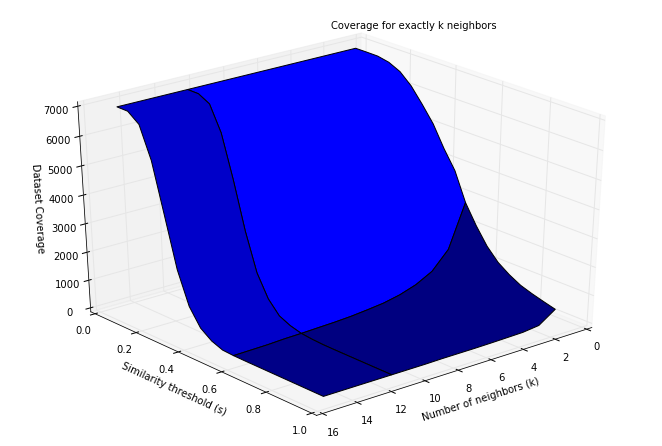

In [101]:
fig=plt.figure(figsize=(9,6))
ax=Axes3D(fig)
ax.text2D(.5,.95,'Coverage for exactly k neighbors',transform=ax.transAxes)
X,Y=np.meshgrid(k_range,s_range)
ax.plot_surface(X,Y,np.array(fullk_coverage))
ax.view_init(None,50)
ax.set_xlabel('Number of neighbors (k)')
ax.set_ylabel('Similarity threshold (s)')
ax.set_zlabel('Dataset Coverage')
plt.savefig(FIG_DIR+'acute_4.png')
plt.show()

In [102]:
pd.DataFrame(fullk_coverage,index=s_range,columns=k_range)

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
0.05,6981.0,6981.0,6981.0,6981.0,6981.0,6981.0,6981.0,6981.0,6981.0,6981.0,6981.0,6981.0,6981.0,6981.0,6981.0
0.10,6981.0,6981.0,6981.0,6981.0,6981.0,6980.0,6980.0,6980.0,6980.0,6979.0,6978.0,6977.0,6976.0,6976.0,6975.0
0.15,6975.0,6966.0,6957.0,6943.0,6919.0,6890.0,6870.0,6850.0,6825.0,6801.0,6775.0,6751.0,6730.0,6707.0,6678.0
0.20,6896.0,6827.0,6716.0,6596.0,6490.0,6383.0,6286.0,6207.0,6124.0,6031.0,5946.0,5856.0,5776.0,5691.0,5622.0
0.25,6712.0,6415.0,6146.0,5876.0,5617.0,5398.0,5196.0,5016.0,4828.0,4654.0,4499.0,4367.0,4229.0,4075.0,3921.0
0.30,6363.0,5728.0,5247.0,4837.0,4473.0,4173.0,3843.0,3539.0,3293.0,3070.0,2870.0,2696.0,2493.0,2350.0,2194.0
0.35,5870.0,4970.0,4274.0,3757.0,3298.0,2924.0,2572.0,2291.0,2051.0,1795.0,1560.0,1391.0,1254.0,1140.0,1064.0
0.40,5336.0,4162.0,3318.0,2644.0,2187.0,1815.0,1515.0,1290.0,1109.0,954.0,799.0,678.0,603.0,542.0,464.0
0.45,4620.0,3165.0,2269.0,1663.0,1303.0,1014.0,811.0,652.0,524.0,423.0,355.0,303.0,265.0,225.0,177.0
0.50,3998.0,2398.0,1585.0,1070.0,774.0,606.0,451.0,335.0,275.0,221.0,172.0,142.0,105.0,64.0,26.0
